In [129]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns',None)

In [130]:
pip install seaborn==0.11.0

     |████████████████████████████████| 283 kB 4.2 MB/s eta 0:00:01
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.10.1
    Uninstalling seaborn-0.10.1:
      Successfully uninstalled seaborn-0.10.1
Note: you may need to restart the kernel to use updated packages.


In [2]:
df = pd.read_csv('mmALL_073119_csv.csv')

# Basic Review of the Dataframe

In [3]:
df.head(2)

,id,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,...,protesterdemand4,stateresponse1,stateresponse2,stateresponse3,stateresponse4,stateresponse5,stateresponse6,stateresponse7,sources,notes
0,201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,...,NaN,ignore,NaN,NaN,NaN,NaN,NaN,NaN,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...
1,201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,...,NaN,ignore,NaN,NaN,NaN,NaN,NaN,NaN,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...


In [4]:
df.shape

(16363, 31)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16363 entries, 0 to 16362
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     16363 non-null  int64  
 1   country                16363 non-null  object 
 2   ccode                  16363 non-null  int64  
 3   year                   16363 non-null  int64  
 4   region                 16363 non-null  object 
 5   protest                16363 non-null  int64  
 6   protestnumber          16363 non-null  int64  
 7   startday               14514 non-null  float64
 8   startmonth             14514 non-null  float64
 9   startyear              14514 non-null  float64
 10  endday                 14514 non-null  float64
 11  endmonth               14514 non-null  float64
 12  endyear                14514 non-null  float64
 13  protesterviolence      15033 non-null  float64
 14  location               14493 non-null  object 
 15  pa

In [6]:
df.columns

Index(['id', 'country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',
       'protesterviolence', 'location', 'participants_category',
       'participants', 'protesteridentity', 'protesterdemand1',
       'protesterdemand2', 'protesterdemand3', 'protesterdemand4',
       'stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4',
       'stateresponse5', 'stateresponse6', 'stateresponse7', 'sources',
       'notes'],
      dtype='object')

In [7]:
categorical_columns = ['country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'protesterviolence',  'participants_category',
       'participants', 'protesterdemand1',
       'protesterdemand2', 'protesterdemand3', 'protesterdemand4',
       'stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4',
       'stateresponse5', 'stateresponse6', 'stateresponse7']

numerical_columns = ['startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',]

id_columns = ['id','sources','notes', 'protesteridentity', 'location']

In [8]:
for category in categorical_columns:
    print(f'Category is: {category}\n.')
    print(df[category].value_counts())
    print('\n\n\n')

Category is: country
.
United Kingdom           547
France                   527
Ireland                  434
Germany                  360
Kenya                    350
                        ... 
Germany East              11
South Sudan                9
Czechoslovakia             6
Serbia and Montenegro      5
Germany West               2
Name: country, Length: 166, dtype: int64




Category is: ccode
.
200    547
220    527
205    434
255    360
501    350
      ... 
529     11
525      9
315      6
678      4
260      2
Name: ccode, Length: 168, dtype: int64




Category is: year
.
2015    920
2014    830
2016    766
2018    746
2011    739
2013    636
1990    630
2012    604
2017    600
2005    551
1997    546
2000    537
2006    525
1998    511
2010    510
2007    504
2004    499
1999    481
2002    477
1992    475
1996    472
2008    460
1994    457
2001    455
2003    453
2009    439
1991    436
1995    425
1993    390
2019    289
Name: year, dtype: int64




Category is: region

In [9]:

def bar_plot(df, columns):
    for category in columns:

        y_names = df[category].value_counts().index
        width = df[category].value_counts()

        plt.figure(figsize=(6,(len(y_names)/4)))
        plt.barh(y_names,width)
        plt.title('Category is: ' + category)
        plt.ylabel('category names')
        plt.xlabel('Number of values in a category')
        plt.show()

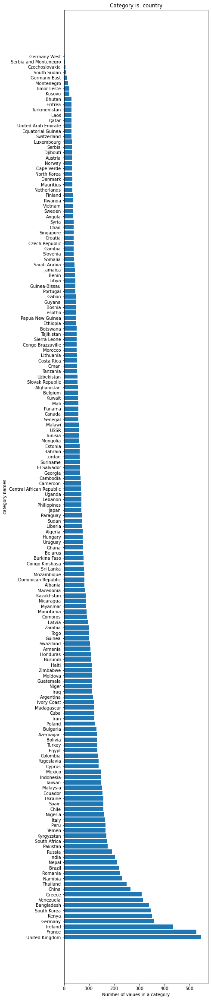

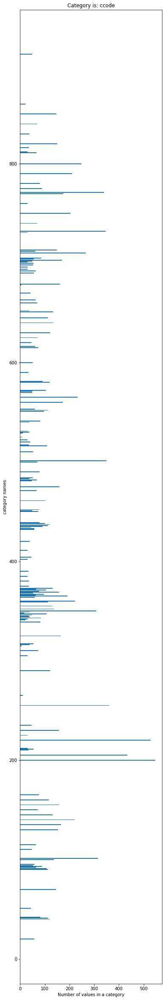

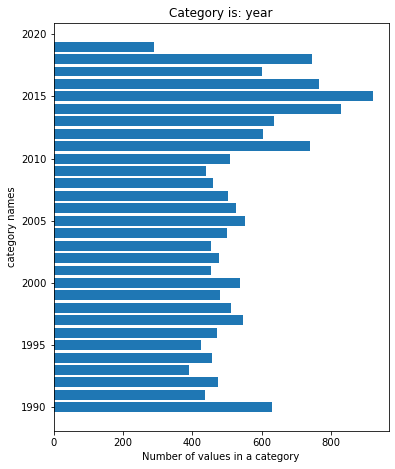

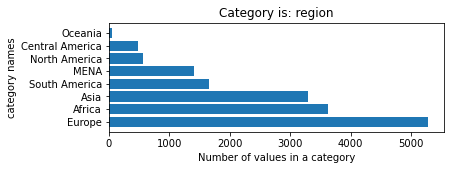

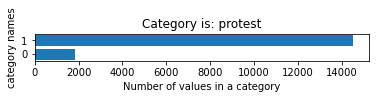

...

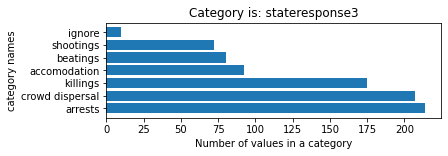

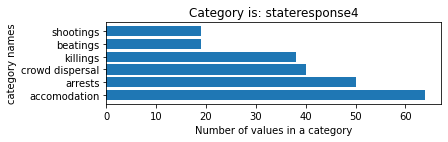

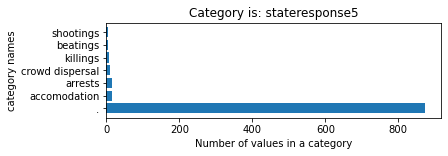

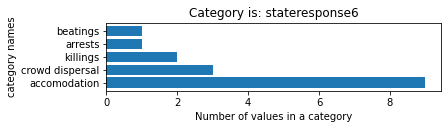

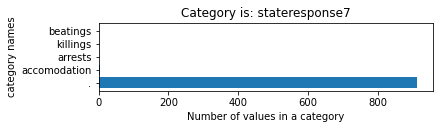

In [10]:
bar_plot(df, categorical_columns)

In [11]:
#Questions - is there a general pattern where a protest starts in one way, has a reaction by the state, and then morphs

# does this occur similarly in a given region?

# do certain regions generally have certain protests?

# is there a pattern to the protest demands (certain demographics in a country - more dictator, ...)


# Update Days (per Aaron)

In [12]:
# some engineering for protest length by total days

df['years'] = df['endyear'] - df['startyear']
df['months'] = df['endmonth'] - df['startmonth']
df['days'] = df['endday'] - df['startday']
df['total_days'] = df['days'] + (df['months']*30.5) + (df['years']*365)

# Review category columns

In [13]:
df.head(2)

,id,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,...,stateresponse4,stateresponse5,stateresponse6,stateresponse7,sources,notes,years,months,days,total_days
0,201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,...,NaN,NaN,NaN,NaN,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...,0.0,0.0,0.0,0.0
1,201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,...,NaN,NaN,NaN,NaN,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...,0.0,0.0,0.0,0.0


## create dummy columns with recognizable column names

In [17]:
protest_demands = ['protesterdemand1','protesterdemand2', 'protesterdemand3', 'protesterdemand4']

state_responses = ['stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4','stateresponse5', 'stateresponse6', 'stateresponse7']




In [18]:
# create dummy columns with recognizable column names

def get_dum_cols(df, list_of_columns):
    list_of_dfs = []

    for col in list_of_columns:
        col_df = pd.get_dummies(df[col])
        list_of_dfs.append(col_df)

    list_of_dfs;

    return list_of_dfs[0] + list_of_dfs[1] + list_of_dfs[2] + list_of_dfs[3] 


# creates a combined dummy dataframe for each
df_protest_demands_group = get_dum_cols(df, protest_demands)
df_protest_demands_group.fillna(0, inplace = True)

df_state_response_group = get_dum_cols(df, state_responses)
df_state_response_group.fillna(0, inplace = True)

In [19]:
df_protest_demands_group.head()

,.,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions
0,0.0,1,0,0,1,0,0,0.0
1,0.0,0,0,0,1,0,0,0.0
2,0.0,0,0,0,1,0,0,0.0
3,0.0,0,1,0,0,0,0,0.0
4,0.0,0,0,0,1,0,0,0.0


In [20]:
df_state_response_group.head()

,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
0,0,0,0,0,0.0,0,0
1,0,0,0,0,0.0,0,0
2,0,0,0,0,0.0,0,0
3,1,0,0,0,0.0,0,0
4,1,1,0,1,0.0,0,0


## change values in category columns, so can add together

In [21]:
# turning columns into demands


protesterdemand_codes = {'political behavior, process':1,
                         'labor wage dispute':10,
                         'price increases, tax policy':100,
                         'removal of politician':1_000,
                         'police brutality':10_000,
                         'land farm issue':100_000,
                         'social restrictions':1_000_000}


stateresponse_codes = {'accomodation':1,
                       'ignore':10,
                       'arrests':100,
                       'crowd dispersal':1_000,
                       'shootings':10_000,
                       'beatings':100_000,
                       'killings':1_000_000}

# turn columns into numbers
# mapping follows Aaron's notes

for col in protest_demands:
    df[col] = df[col].map(protesterdemand_codes)
    
for col in state_responses:
    df[col] = df[col].map(stateresponse_codes)   
    
df[protest_demands] = df[protest_demands].fillna(0)
df[state_responses] = df[state_responses].fillna(0)    

df['protesterdemand'] = df['protesterdemand1'] + df['protesterdemand2'] + df['protesterdemand3'] + df['protesterdemand4']

df['stateresponse'] = df['stateresponse1'] + df['stateresponse2'] + df['stateresponse3'] + df['stateresponse4'] + df['stateresponse5'] + df['stateresponse6'] + df['stateresponse7'] 

In [22]:
df[protest_demands].head()

,protesterdemand1,protesterdemand2,protesterdemand3,protesterdemand4
0,1.0,10.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0
3,100000.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0


In [23]:
df[state_responses].head()

,stateresponse1,stateresponse2,stateresponse3,stateresponse4,stateresponse5,stateresponse6,stateresponse7
0,10.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1000.0,100.0,1.0,0.0,0.0,0.0,0.0


In [24]:
# Figure out how many different combinations of protester demands there were
df['protesterdemand'].value_counts().sort_index()

0.0          1860
1.0          7744
10.0         1349
11.0          478
100.0         772
             ... 
1011000.0       1
1011001.0       1
1100000.0       7
1100001.0       1
1100011.0       1
Name: protesterdemand, Length: 64, dtype: int64

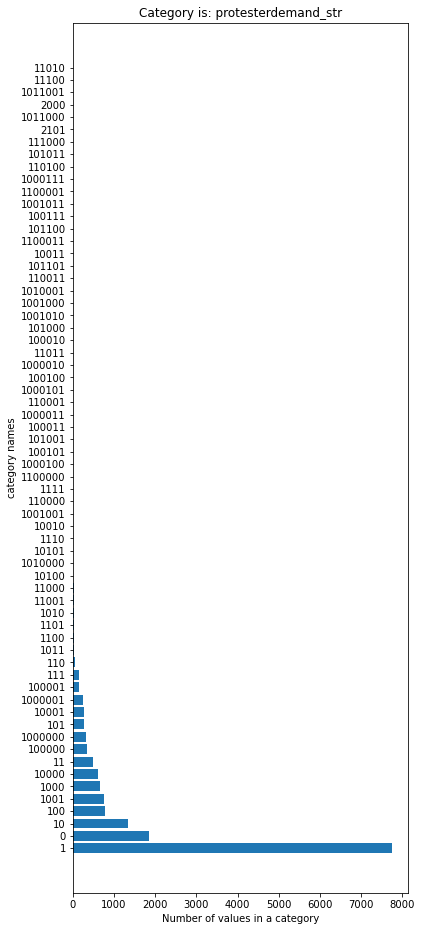

In [25]:
df['protesterdemand_int'] = df['protesterdemand'].apply(lambda x: int(x))
df['protesterdemand_str'] = df['protesterdemand_int'].apply(lambda x: str(x))

bar_plot(df, ['protesterdemand_str'])

In [26]:
# Figure out how many different combinations of state response there were

df['stateresponse'].value_counts().sort_index()

0.0          1878
1.0           867
10.0         7688
11.0          145
100.0         602
             ... 
1111100.0      12
1111101.0       5
1112001.0       1
2000000.0       1
2100100.0       1
Name: stateresponse, Length: 115, dtype: int64

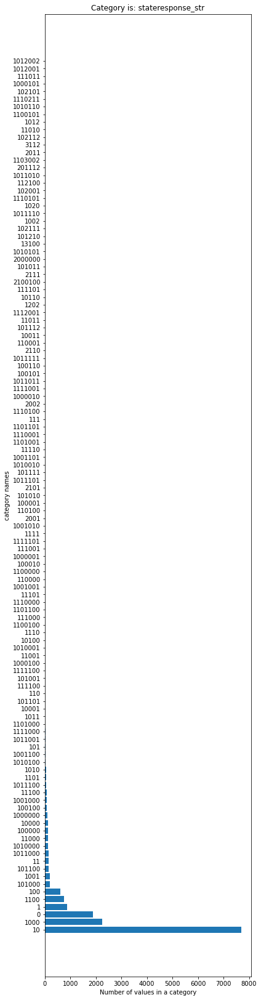

In [27]:
df['stateresponse_int'] = df['stateresponse'].apply(lambda x: int(x))
df['stateresponse_str'] = df['stateresponse_int'].apply(lambda x: str(x))

bar_plot(df, ['stateresponse_str'])

In [28]:
# most categories only appear once (likely an error where they appear twice)

# Create a cleaned up data frame

In [29]:
# create a final data frame of relevant columns

df.columns

Index(['id', 'country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',
       'protesterviolence', 'location', 'participants_category',
       'participants', 'protesteridentity', 'protesterdemand1',
       'protesterdemand2', 'protesterdemand3', 'protesterdemand4',
       'stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4',
       'stateresponse5', 'stateresponse6', 'stateresponse7', 'sources',
       'notes', 'years', 'months', 'days', 'total_days', 'protesterdemand',
       'stateresponse', 'protesterdemand_int', 'protesterdemand_str',
       'stateresponse_int', 'stateresponse_str'],
      dtype='object')

In [30]:
df_short = df[['id', 'country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',
       'protesterviolence', 'location', 'participants_category',
       'participants', 'protesteridentity', 'sources',
       'notes', 'total_days', 'protesterdemand',
       'stateresponse']].copy()

In [31]:
# combines relevant columns from original dataframe (df_short), 
# with the dummified columns of protest demands (df_protest_demands_group),
# and the dummified columns of state response from above (df_state_response_group)

df_with_categories = pd.concat([df_short, df_protest_demands_group, df_state_response_group], axis = 1)

In [32]:
# set the index to the id since the id won't be used otherwise anyway

df_with_categories.set_index('id', inplace=True)

In [33]:
# explore cleaned up dataframe

df_with_categories.head()

,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,...,0,0,0.0,1,0,0,0,0.0,0,0
201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,...,0,0,0.0,1,1,0,1,0.0,0,0


In [34]:
df_with_categories.columns

Index(['country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',
       'protesterviolence', 'location', 'participants_category',
       'participants', 'protesteridentity', 'sources', 'notes', 'total_days',
       'protesterdemand', 'stateresponse', '.', 'labor wage dispute',
       'land farm issue', 'police brutality', 'political behavior, process',
       'price increases, tax policy', 'removal of politician',
       'social restrictions', 'accomodation', 'arrests', 'beatings',
       'crowd dispersal', 'ignore', 'killings', 'shootings'],
      dtype='object')

In [35]:
df_with_categories.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16363 entries, 201990001 to 9102019000
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   country                      16363 non-null  object 
 1   ccode                        16363 non-null  int64  
 2   year                         16363 non-null  int64  
 3   region                       16363 non-null  object 
 4   protest                      16363 non-null  int64  
 5   protestnumber                16363 non-null  int64  
 6   startday                     14514 non-null  float64
 7   startmonth                   14514 non-null  float64
 8   startyear                    14514 non-null  float64
 9   endday                       14514 non-null  float64
 10  endmonth                     14514 non-null  float64
 11  endyear                      14514 non-null  float64
 12  protesterviolence            15033 non-null  float64
 13  loc

In [36]:
df_with_categories.describe()

,ccode,year,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
count,16363.000000,16363.000000,16363.000000,16363.000000,14514.000000,14514.000000,14514.000000,14514.000000,14514.000000,14514.000000,...,16363.000000,16363.000000,16363.0,16363.000000,16363.000000,16363.000000,16363.000000,16363.0,16363.000000,16363.000000
mean,436.412883,2005.544093,0.887001,7.169651,15.450324,6.162464,2005.684649,15.575720,6.179964,2005.687405,...,0.083909,0.098637,0.0,0.090142,0.122533,0.046996,0.270549,0.0,0.046446,0.052924
std,232.426438,8.718902,0.316601,11.635211,8.830148,3.454530,8.696184,8.815945,3.454780,8.697528,...,0.277259,0.298593,0.0,0.287247,0.328096,0.211637,0.447410,0.0,0.211036,0.223889
min,20.000000,1990.000000,0.000000,0.000000,1.000000,1.000000,1990.000000,1.000000,1.000000,1990.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,220.000000,1998.000000,1.000000,1.000000,8.000000,3.000000,1998.000000,8.000000,3.000000,1998.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
50%,433.000000,2006.000000,1.000000,3.000000,15.000000,6.000000,2007.000000,16.000000,6.000000,2007.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
75%,645.000000,2014.000000,1.000000,8.000000,23.000000,9.000000,2014.000000,23.000000,9.000000,2014.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000
max,910.000000,2019.000000,1.000000,143.000000,31.000000,12.000000,2019.000000,31.000000,12.000000,2019.000000,...,1.000000,2.000000,0.0,2.000000,2.000000,1.000000,3.000000,0.0,2.000000,1.000000


In [37]:
# dataframe of when accommodations met

acc = df_with_categories[df_with_categories['accomodation'] == 1].drop(columns = ['protesterdemand', 'stateresponse','year','startyear','endyear']).copy()
acc.head()

,country,ccode,region,protest,protestnumber,startday,startmonth,endday,endmonth,protesterviolence,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,
201990004,Canada,20,North America,1,4,12.0,7.0,6.0,9.0,1.0,...,0,0,0.0,1,0,0,0,0.0,0,0
201990005,Canada,20,North America,1,5,14.0,8.0,15.0,8.0,1.0,...,0,0,0.0,1,1,0,1,0.0,0,0
202000002,Canada,20,North America,1,2,26.0,2.0,26.0,2.0,0.0,...,0,0,0.0,1,0,0,0,0.0,0,0
202016006,Canada,20,North America,1,6,12.0,4.0,12.0,4.0,0.0,...,0,0,0.0,1,0,0,0,0.0,0,0
202018001,Canada,20,North America,1,1,9.0,2.0,9.0,2.0,0.0,...,0,0,0.0,1,0,0,0,0.0,0,0


In [38]:
# when accommodations not met

no_acc = df_with_categories[df_with_categories['accomodation'] == 0].drop(columns = ['protesterdemand', 'stateresponse','year','startyear','endyear']).copy()
no_acc.head()

,country,ccode,region,protest,protestnumber,startday,startmonth,endday,endmonth,protesterviolence,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,North America,1,1,15.0,1.0,15.0,1.0,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990002,Canada,20,North America,1,2,25.0,6.0,25.0,6.0,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990003,Canada,20,North America,1,3,1.0,7.0,1.0,7.0,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990006,Canada,20,North America,1,6,19.0,9.0,19.0,9.0,0.0,...,0,0,0.0,0,0,0,1,0.0,0,1
201991001,Canada,20,North America,1,1,10.0,9.0,17.0,9.0,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0


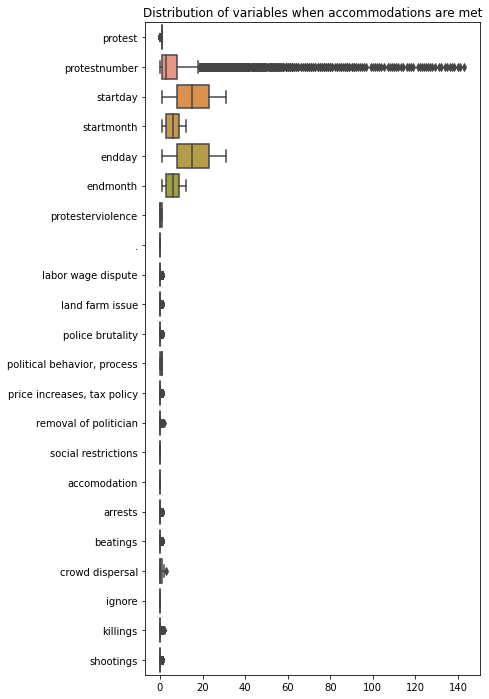

In [39]:
#https://seaborn.pydata.org/generated/seaborn.boxplot.html
    

plt.figure(figsize = (6,12))
sns.boxplot(data=no_acc.drop(columns = ['ccode','total_days']), orient = 'h')
plt.title('Distribution of variables when accommodations are met');

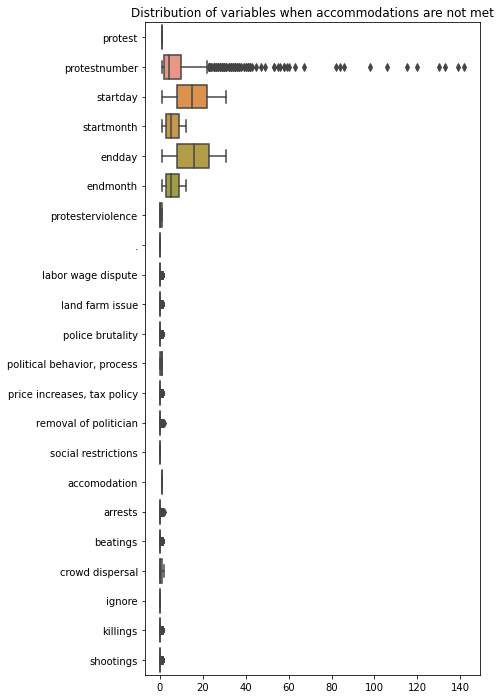

In [40]:
plt.figure(figsize = (6,12))
sns.boxplot(data=acc.drop(columns = ['ccode','total_days']), orient = 'h')
plt.title('Distribution of variables when accommodations are not met');

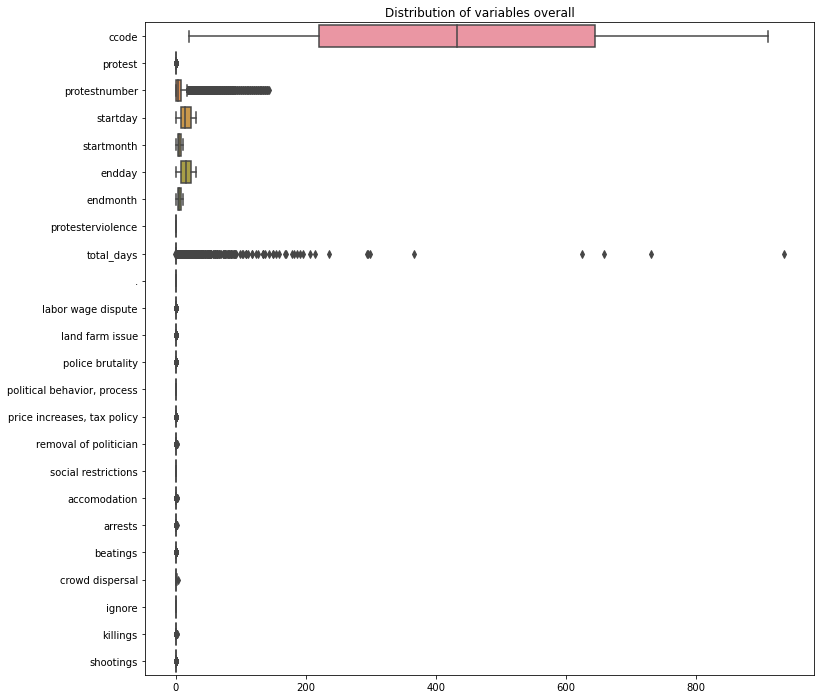

In [41]:
df_acc_test = df_with_categories.drop(columns = ['protesterdemand', 'stateresponse','year','startyear','endyear']).copy()

plt.figure(figsize = (12,12))
sns.boxplot(data=df_acc_test, orient = 'h')
plt.title('Distribution of variables overall');

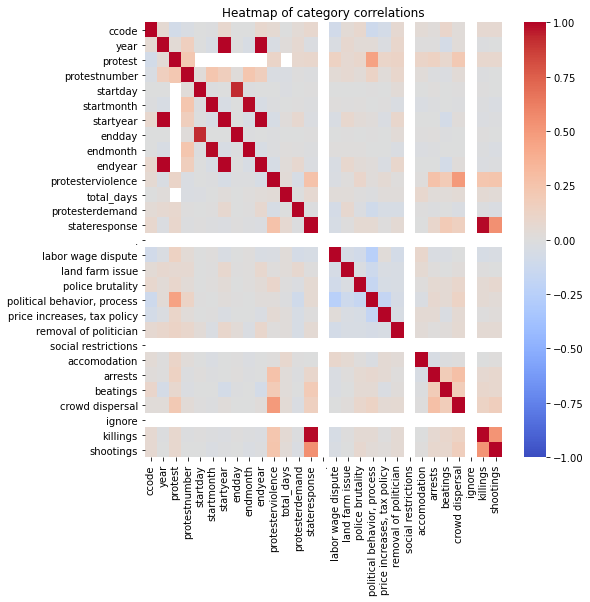

In [42]:
plt.figure(figsize = (8,8))
sns.heatmap(df_with_categories.corr(),
            cmap = 'coolwarm',
            vmin = -1,
            vmax = 1)
plt.title('Heatmap of category correlations');

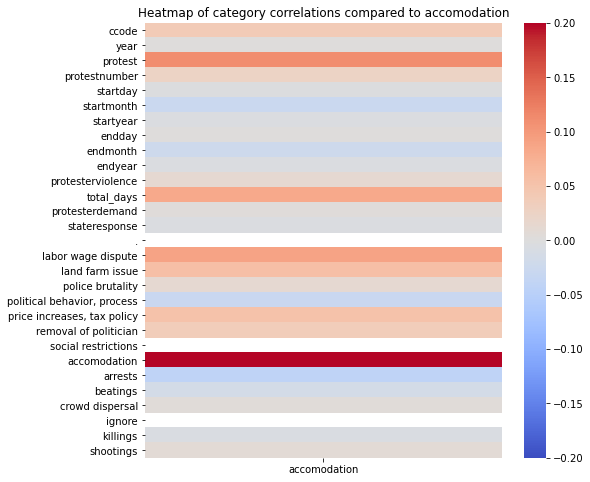

In [43]:
plt.figure(figsize = (8,8))
sns.heatmap(df_with_categories.corr()[['accomodation']],
            cmap = 'coolwarm',
            vmin = -.2,
            vmax = .2)
plt.title('Heatmap of category correlations compared to accomodation');

In [44]:
df_with_categories.corr()[['accomodation']]

,accomodation
ccode,0.039800
year,0.001842
protest,0.112011
protestnumber,0.026109
startday,-0.002272
startmonth,-0.027222
startyear,-0.003447
endday,0.001852
endmonth,-0.022667
endyear,-0.003187


In [45]:
df_with_categories.head()

,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,...,0,0,0.0,1,0,0,0,0.0,0,0
201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,...,0,0,0.0,1,1,0,1,0.0,0,0


In [51]:
df_with_categories[df_with_categories['country'] == 'Canada']

,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,...,0,0,0.0,1,0,0,0,0.0,0,0
201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,...,0,0,0.0,1,1,0,1,0.0,0,0
201990006,Canada,20,1990,North America,1,6,19.0,9.0,1990.0,19.0,...,0,0,0.0,0,0,0,1,0.0,0,1
201991001,Canada,20,1991,North America,1,1,10.0,9.0,1991.0,17.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201991002,Canada,20,1991,North America,1,2,28.0,9.0,1991.0,2.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201992001,Canada,20,1992,North America,1,1,4.0,5.0,1992.0,5.0,...,0,0,0.0,0,1,0,0,0.0,0,0


In [64]:
df_countries_test = df_with_categories[df_with_categories['country'] == 'Canada'].drop(columns = ['total_days','notes','sources','protesteridentity','location','country','ccode','region','protesterdemand', 'stateresponse','year','startyear','endyear']).copy()
df_countries_test.head()

,protest,protestnumber,startday,startmonth,endday,endmonth,protesterviolence,participants_category,participants,.,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,
201990001,1,1,15.0,1.0,15.0,1.0,0.0,NaN,1000s,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990002,1,2,25.0,6.0,25.0,6.0,0.0,NaN,1000,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990003,1,3,1.0,7.0,1.0,7.0,0.0,NaN,500,0.0,...,0,0,0.0,0,0,0,0,0.0,0,0
201990004,1,4,12.0,7.0,6.0,9.0,1.0,NaN,100s,0.0,...,0,0,0.0,1,0,0,0,0.0,0,0
201990005,1,5,14.0,8.0,15.0,8.0,1.0,NaN,950,0.0,...,0,0,0.0,1,1,0,1,0.0,0,0


In [73]:
list_of_demands = list(df_protest_demands_group.drop(columns='.').columns)
list_of_demands

['labor wage dispute',
 'land farm issue',
 'police brutality',
 'political behavior, process',
 'price increases, tax policy',
 'removal of politician',
 'social restrictions']

In [72]:
list_of_responses = list(df_state_response_group.columns)
list_of_responses

['accomodation',
 'arrests',
 'beatings',
 'crowd dispersal',
 'ignore',
 'killings',
 'shootings']

In [104]:
for response in list_of_responses:
    plt.figure(figsize = (5,5))
    # sns.boxplot(data=df_countries_test, orient = 'h')
    sns.distplot(df_countries_test[response])
    plt.title(f'Distribution of Response: {category}');

AttributeError: module 'seaborn' has no attribute 'displot'

<Figure size 360x360 with 0 Axes>

In [79]:
df_with_categories.groupby('region').mean()

,ccode,year,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
region,,,,,,,,,,,,,,,,,,,,,
Africa,501.854545,2006.076309,0.838292,7.411570,15.806441,6.141637,2006.391061,15.890569,6.147880,2006.392047,...,0.066667,0.110193,0.0,0.103857,0.138843,0.064463,0.363636,0.0,0.084573,0.106887
Asia,760.504545,2005.472727,0.905152,6.538788,15.073652,6.245732,2005.584198,15.281553,6.282223,2005.586207,...,0.058485,0.095758,0.0,0.113030,0.134848,0.071818,0.270000,0.0,0.049697,0.045455
Central America,92.061983,2004.493802,0.902893,3.330579,15.974828,6.157895,2004.288330,15.848970,6.215103,2004.288330,...,0.159091,0.136364,0.0,0.074380,0.109504,0.028926,0.283058,0.0,0.043388,0.105372
Europe,295.352283,2005.176047,0.911692,9.220959,15.495115,6.241322,2005.211391,15.515901,6.241322,2005.214301,...,0.113511,0.087360,0.0,0.069926,0.104226,0.028994,0.210536,0.0,0.006254,0.007770
MENA,651.962411,2008.188652,0.777305,4.980142,15.597628,5.715328,2009.766423,15.714416,5.729015,2009.772810,...,0.063830,0.152482,0.0,0.060993,0.119858,0.067376,0.239007,0.0,0.090071,0.100000
North America,47.139286,2006.576786,0.892857,6.605357,14.434000,6.098000,2006.650000,14.326000,6.170000,2006.652000,...,0.071429,0.155357,0.0,0.076786,0.167857,0.023214,0.167857,0.0,0.037500,0.078571
Oceania,910.000000,2004.061224,0.775510,1.469388,17.815789,6.500000,2003.578947,17.578947,6.578947,2003.578947,...,0.000000,0.122449,0.0,0.285714,0.020408,0.000000,0.244898,0.0,0.040816,0.061224
South America,130.816697,2003.438596,0.969147,4.701149,15.358926,6.129213,2003.288390,15.878901,6.158552,2003.294007,...,0.079855,0.038113,0.0,0.107078,0.114338,0.013914,0.317604,0.0,0.051422,0.029038


In [82]:
df_with_categories.groupby('country').mean().sort_values('accomodation', ascending = False)

,ccode,year,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,...,"price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
country,,,,,,,,,,,,,,,,,,,,,
Madagascar,580.0,2008.516667,0.916667,11.991667,16.027273,5.427273,2009.181818,15.600000,5.363636,2009.190909,...,0.016667,0.533333,0.0,0.425000,0.091667,0.016667,0.150000,0.0,0.116667,0.116667
Bolivia,145.0,2001.946565,1.000000,3.893130,15.832061,5.671756,2001.946565,16.847328,5.687023,2001.961832,...,0.083969,0.045802,0.0,0.305344,0.160305,0.022901,0.427481,0.0,0.076336,0.076336
Papua New Guinea,910.0,2004.061224,0.775510,1.469388,17.815789,6.500000,2003.578947,17.578947,6.578947,2003.578947,...,0.000000,0.122449,0.0,0.285714,0.020408,0.000000,0.244898,0.0,0.040816,0.061224
Vietnam,816.0,2003.857143,0.542857,0.685714,12.052632,5.684211,2004.842105,16.842105,6.368421,2004.842105,...,0.057143,0.057143,0.0,0.228571,0.200000,0.057143,0.285714,0.0,0.000000,0.000000
Namibia,565.0,2007.733906,0.965665,7.227468,15.911111,6.551111,2007.928889,15.848889,6.617778,2007.933333,...,0.060086,0.098712,0.0,0.223176,0.038627,0.012876,0.175966,0.0,0.000000,0.012876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Serbia and Montenegro,347.0,2004.200000,0.400000,0.600000,12.500000,8.000000,2003.000000,12.500000,8.000000,2003.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.200000,0.400000,0.0,0.000000,0.000000
South Sudan,525.0,2015.000000,0.111111,0.111111,8.000000,12.000000,2012.000000,9.000000,12.000000,2012.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.222222,0.000000
Qatar,694.0,2004.500000,0.033333,0.033333,8.000000,11.000000,2001.000000,13.000000,11.000000,2001.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000


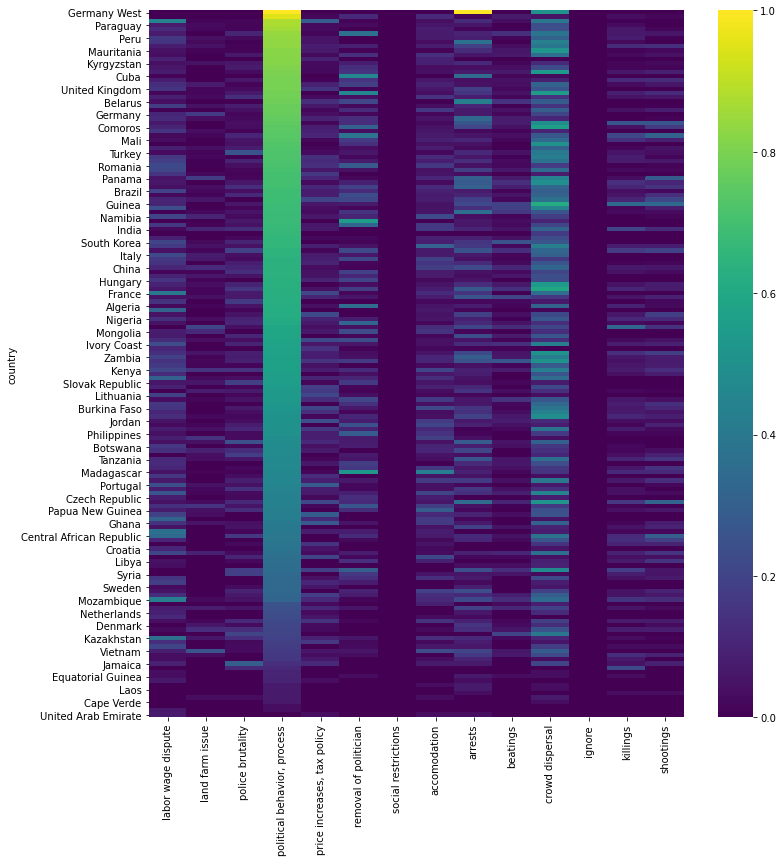

In [96]:
df_country = df_with_categories.groupby('country').mean().sort_values('political behavior, process', ascending = False).drop(columns = ['ccode','year','protest','protestnumber','startday','startmonth','startyear','endday','endmonth','endyear','protesterviolence', 'total_days', 'protesterdemand', 'stateresponse','.'])

plt.figure(figsize = (12,13))
sns.heatmap(df_country,
            vmin = 0,
            vmax = 1,
            cmap = 'viridis');

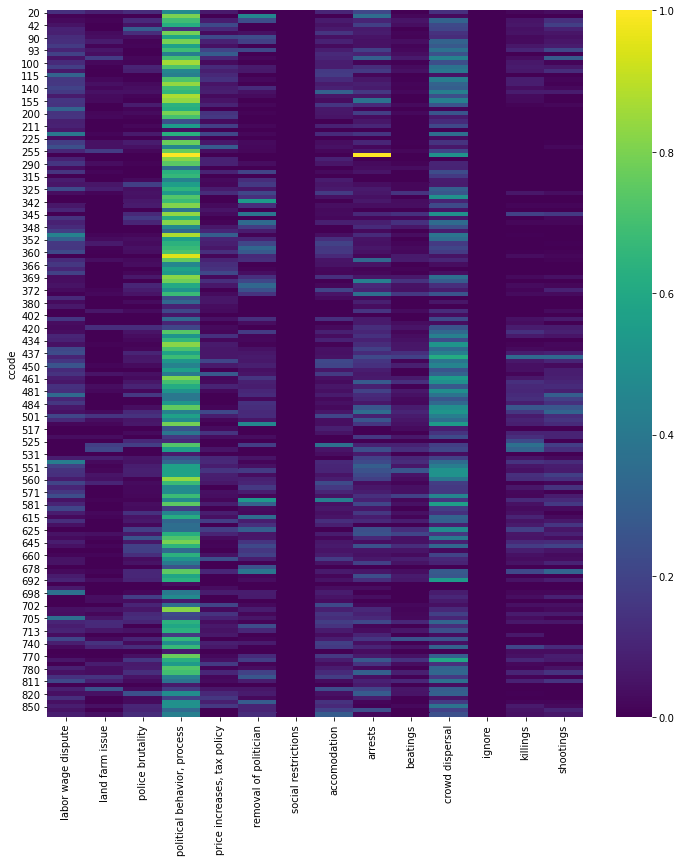

In [100]:
df_country = df_with_categories.groupby('ccode').mean().drop(columns = ['year','protest','protestnumber','startday','startmonth','startyear','endday','endmonth','endyear','protesterviolence', 'total_days', 'protesterdemand', 'stateresponse','.'])

plt.figure(figsize = (12,13))
sns.heatmap(df_country,
            vmin = 0,
            vmax = 1,
            cmap = 'viridis');

In [117]:
countries = list(df_with_categories['country'].unique())

In [125]:
countries = list(df['country'].unique())
countries

['Canada',
 'Cuba',
 'Haiti',
 'Dominican Republic',
 'Jamaica',
 'Mexico',
 'Guatemala',
 'Honduras',
 'El Salvador',
 'Nicaragua',
 'Costa Rica',
 'Panama',
 'Colombia',
 'Venezuela',
 'Guyana',
 'Suriname',
 'Ecuador',
 'Peru',
 'Brazil',
 'Bolivia',
 'Paraguay',
 'Chile',
 'Argentina',
 'Uruguay',
 'United Kingdom',
 'Ireland',
 'Netherlands',
 'Belgium',
 'Luxembourg',
 'France',
 'Switzerland',
 'Spain',
 'Portugal',
 'Germany',
 'Germany West',
 'Germany East',
 'Poland',
 'Austria',
 'Hungary',
 'Czechoslovakia',
 'Czech Republic',
 'Slovak Republic',
 'Italy',
 'Albania',
 'Kosovo',
 'Serbia',
 'Macedonia',
 'Croatia',
 'Yugoslavia',
 'Bosnia',
 'Serbia and Montenegro',
 'Montenegro',
 'Slovenia',
 'Greece',
 'Cyprus',
 'Bulgaria',
 'Moldova',
 'Romania',
 'USSR',
 'Russia',
 'Estonia',
 'Latvia',
 'Lithuania',
 'Ukraine',
 'Belarus',
 'Armenia',
 'Georgia',
 'Azerbaijan',
 'Finland',
 'Sweden',
 'Norway',
 'Denmark',
 'Cape Verde',
 'Guinea-Bissau',
 'Equatorial Guinea',
 'Ga

In [121]:
xticks = list(range(1990,2020,1))

In [139]:
df_with_categories.head()

,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,protesterviolence,location,participants_category,participants,protesteridentity,sources,notes,total_days,protesterdemand,stateresponse,.,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,1.0,1990.0,0.0,national,NaN,1000s,unspecified,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...,0.0,11.0,10.0,0.0,1,0,0,1,0,0,0.0,0,0,0,0,0.0,0,0
201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,6.0,1990.0,0.0,"Montreal, Quebec",NaN,1000,unspecified,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...,0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0,0.0,0,0
201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,7.0,1990.0,0.0,"Montreal, Quebec",NaN,500,separatist Parti Quebecois,1. Quebec protest after Queen calls for unity ...,"THE Queen, after calling on Canadians to rema...",0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0,0.0,0,0
201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,9.0,1990.0,1.0,"Montreal, Quebec",NaN,100s,Mohawk Indians,1. Indians Gather as Siege Intensifies; Armed ...,Canada s federal government has agreed to acq...,55.0,100000.0,1.0,0.0,0,1,0,0,0,0,0.0,1,0,0,0,0.0,0,0
201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,8.0,1990.0,1.0,"Montreal, Quebec",NaN,950,local residents,1. Dozens hurt in Mohawk blockade protest The ...,Protests were directed against the state due t...,1.0,1.0,1101.0,0.0,0,0,0,1,0,0,0.0,1,1,0,1,0.0,0,0


<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10,3))
<ipython-input-122-2abf5639e375>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

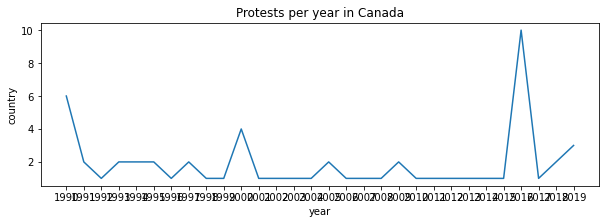

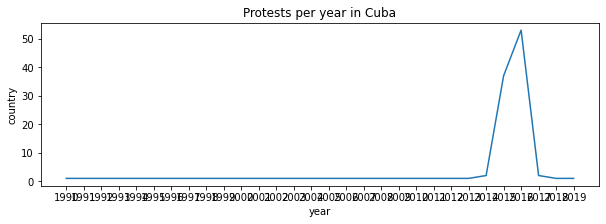

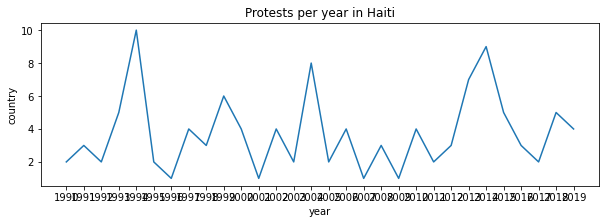

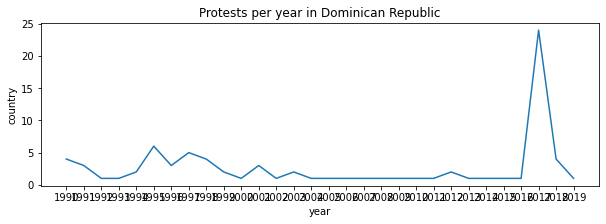

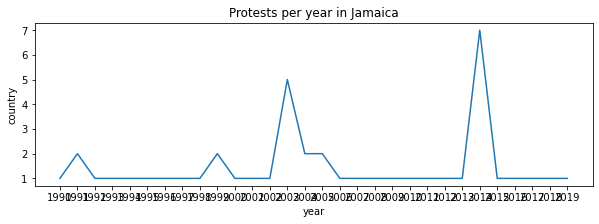

...

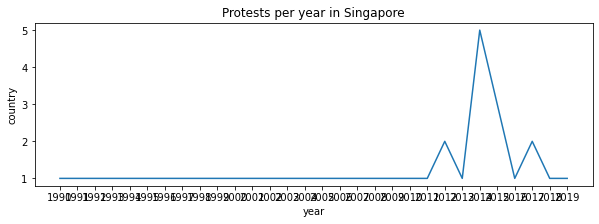

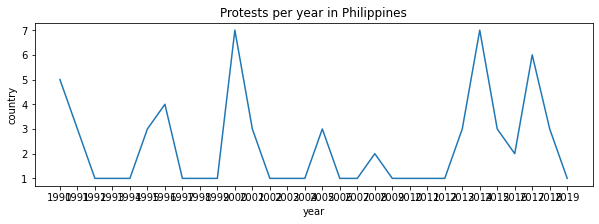

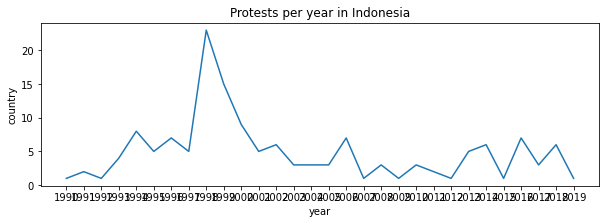

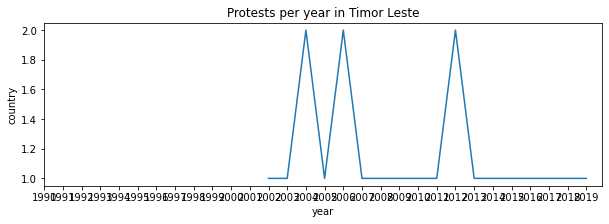

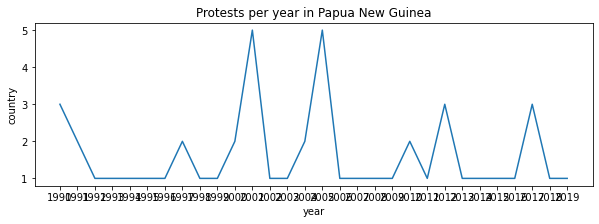

In [122]:
for country in countries:
    data = df_with_categories[df_with_categories['country'] == country].groupby('year').count()['country']

    plt.figure(figsize = (15,3))
    sns.lineplot(x = data.index, y = data)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {country}')

In [147]:
df_with_categories[df_with_categories['country'] == 'France'].groupby('year').sum()['accomodation']

year
1990    4
1991    3
1992    1
1993    2
1994    5
1995    7
1996    3
1997    7
1998    4
1999    1
2000    3
2001    0
2002    1
2003    2
2004    0
2005    1
2006    3
2007    0
2008    2
2009    1
2010    0
2011    0
2012    0
2013    1
2014    0
2015    4
2016    2
2017    0
2018    4
2019    1
Name: accomodation, dtype: uint8

In [174]:
df_with_categories.head()

,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,protesterviolence,location,participants_category,participants,protesteridentity,sources,notes,total_days,protesterdemand,stateresponse,.,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,1.0,1990.0,0.0,national,NaN,1000s,unspecified,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...,0.0,11.0,10.0,0.0,1,0,0,1,0,0,0.0,0,0,0,0,0.0,0,0
201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,6.0,1990.0,0.0,"Montreal, Quebec",NaN,1000,unspecified,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...,0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0,0.0,0,0
201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,7.0,1990.0,0.0,"Montreal, Quebec",NaN,500,separatist Parti Quebecois,1. Quebec protest after Queen calls for unity ...,"THE Queen, after calling on Canadians to rema...",0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0,0.0,0,0
201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,9.0,1990.0,1.0,"Montreal, Quebec",NaN,100s,Mohawk Indians,1. Indians Gather as Siege Intensifies; Armed ...,Canada s federal government has agreed to acq...,55.0,100000.0,1.0,0.0,0,1,0,0,0,0,0.0,1,0,0,0,0.0,0,0
201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,8.0,1990.0,1.0,"Montreal, Quebec",NaN,950,local residents,1. Dozens hurt in Mohawk blockade protest The ...,Protests were directed against the state due t...,1.0,1.0,1101.0,0.0,0,0,0,1,0,0,0.0,1,1,0,1,0.0,0,0


In [165]:
cols_to_drop = list (df_with_categories[df_with_categories['country'] == 'France'].groupby('year').sum()[list_of_demands].sum()[df_with_categories[df_with_categories['country'] == 'France'].groupby('year').sum()[list_of_demands].sum() == 0].index)

['social restrictions']

In [169]:
list_of_demands 

['labor wage dispute',
 'land farm issue',
 'police brutality',
 'political behavior, process',
 'price increases, tax policy',
 'removal of politician',
 'social restrictions']

In [171]:
demands_palette = {'labor wage dispute':'red',
           'land farm issue': 'hotpink',
           'police brutality': 'blue',
           'political behavior, process': 'green',
           'price increases, tax policy': 'orange',
           'removal of politician': 'yellow',
           'social restrictions': 'purple'}

country = 'France'
for country in countries:

    cols_to_drop = list (df_with_categories[df_with_categories['country'] == country].groupby('year').sum()[list_of_demands].sum()[df_with_categories[df_with_categories['country'] == country].groupby('year').sum()[list_of_demands].sum() == 0].index)
    data = df_with_categories[df_with_categories['country'] == country].groupby('year').sum()[list_of_demands].drop(columns = cols_to_drop)

    plt.figure(figsize = (15,3))
    sns.lineplot(data = data, palette = demands_palette, linewidth=2.5)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {country}')

<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-146-d39d85f5b8c7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

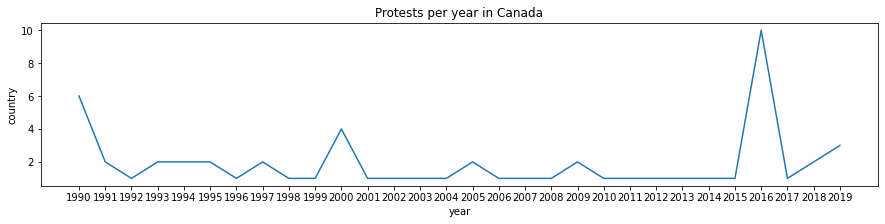

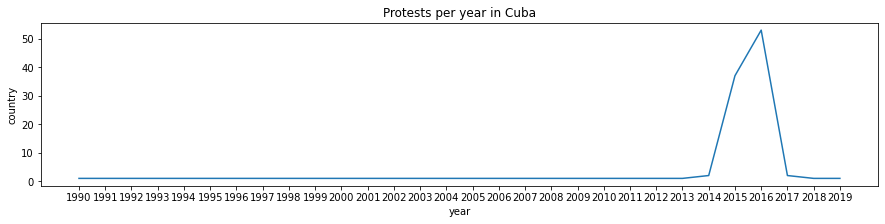

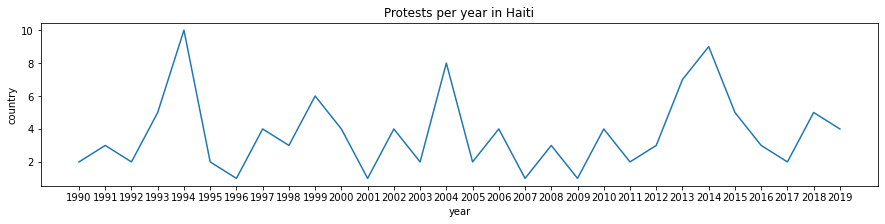

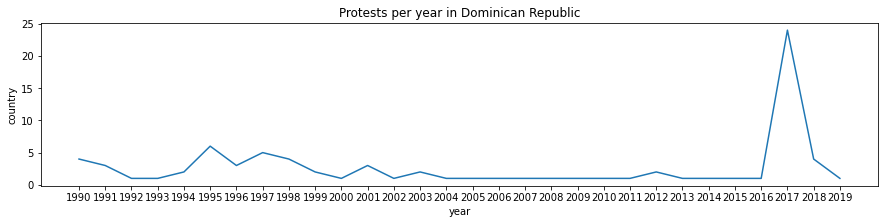

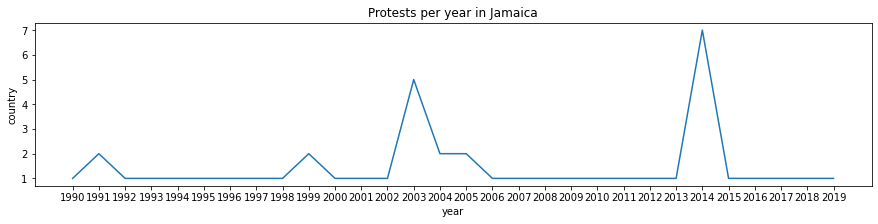

...

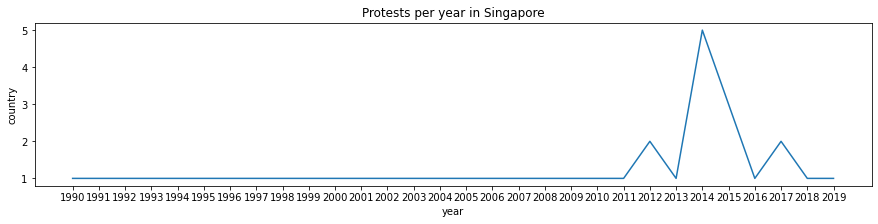

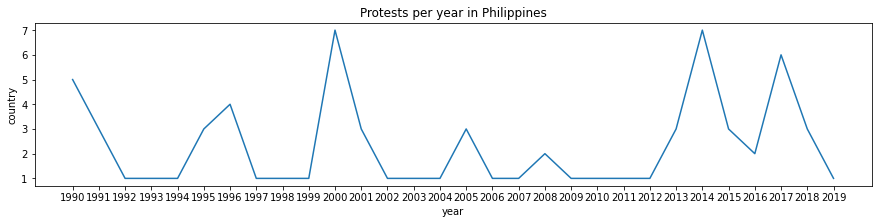

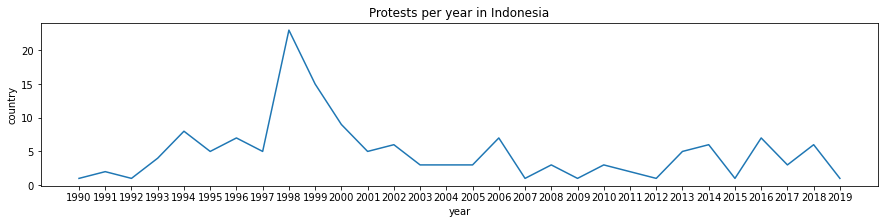

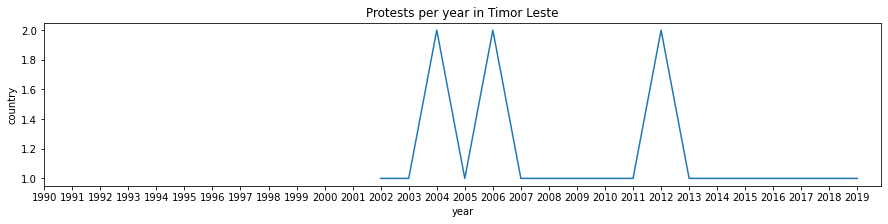

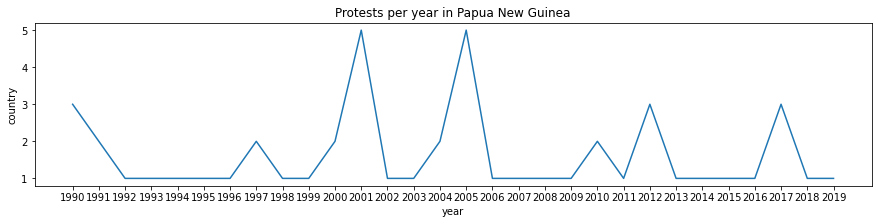

In [146]:
for country in countries:
    data = df[df['country'] == country].groupby('year').count()['country']

    plt.figure(figsize = (15,3))
    sns.lineplot(x = data.index, y = data)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {country}')

In [175]:
list_of_responses

['accomodation',
 'arrests',
 'beatings',
 'crowd dispersal',
 'ignore',
 'killings',
 'shootings']

<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize

<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize

<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize

<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize

<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize

<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-176-07f965cca4d7>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize

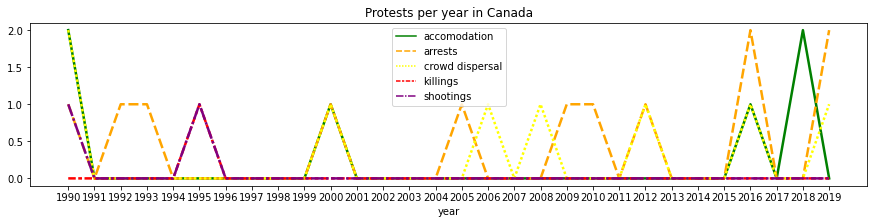

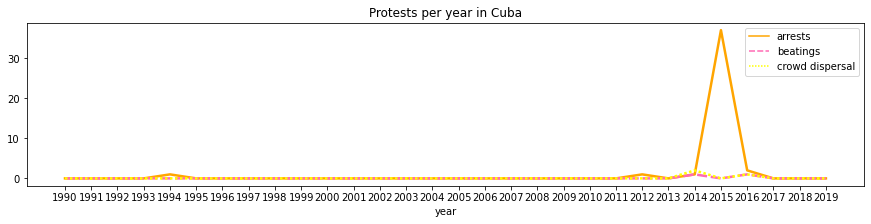

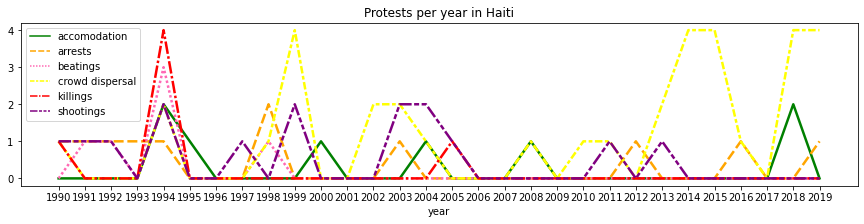

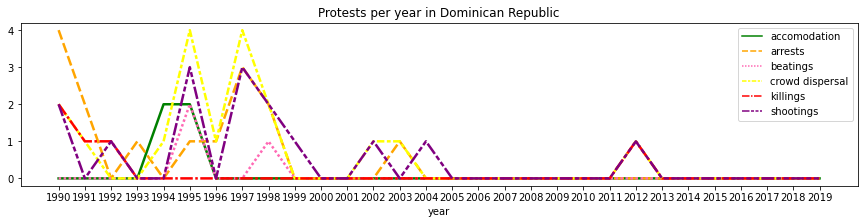

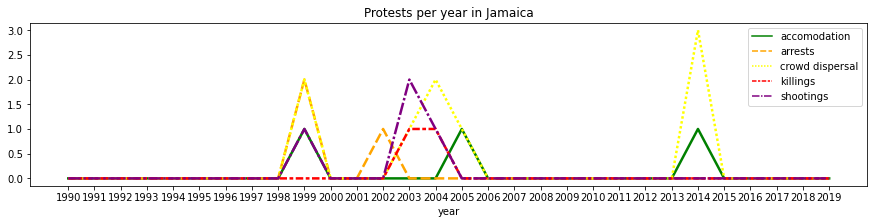

...

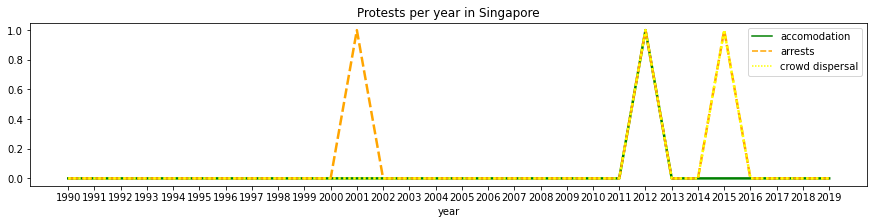

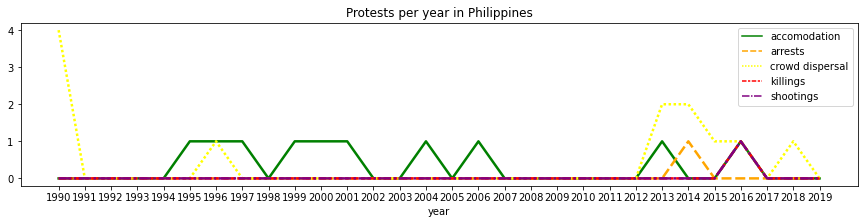

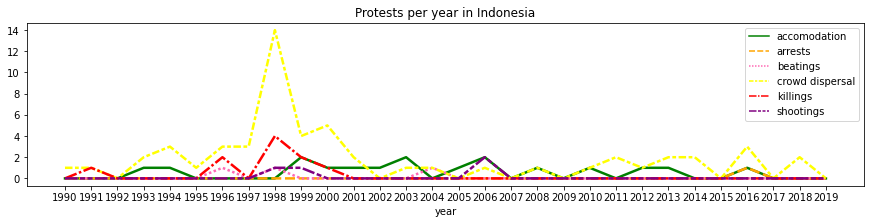

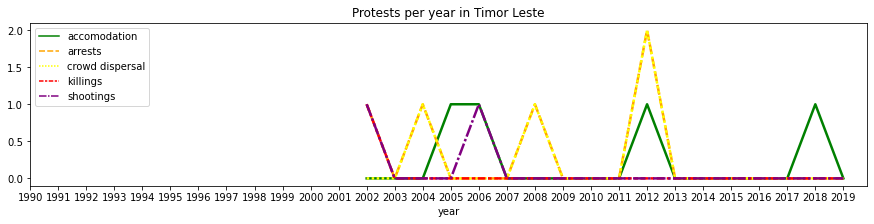

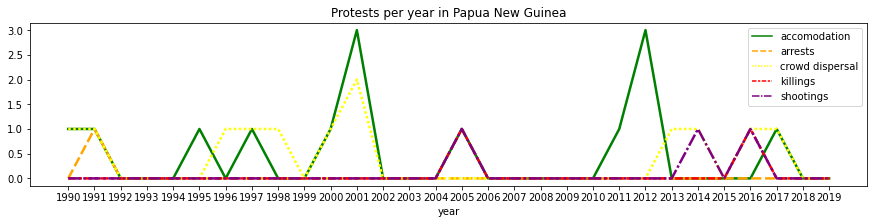

In [176]:
response_palette = {'accomodation':'green',
           'arrests': 'orange',
           'beatings': 'hotpink',
           'crowd dispersal': 'yellow',
           'ignore': 'blue',
           'killings': 'red',
           'shootings': 'purple'}

country = 'France'
for country in countries:

    cols_to_drop = list (df_with_categories[df_with_categories['country'] == country].groupby('year').sum()[list_of_responses].sum()[df_with_categories[df_with_categories['country'] == country].groupby('year').sum()[list_of_responses].sum() == 0].index)
    data = df_with_categories[df_with_categories['country'] == country].groupby('year').sum()[list_of_responses].drop(columns = cols_to_drop)

    plt.figure(figsize = (15,3))
    sns.lineplot(data = data, palette = response_palette, linewidth=2.5)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {country}')

In [ ]:
regions = list(df_with_categories['region'].unique())
regions

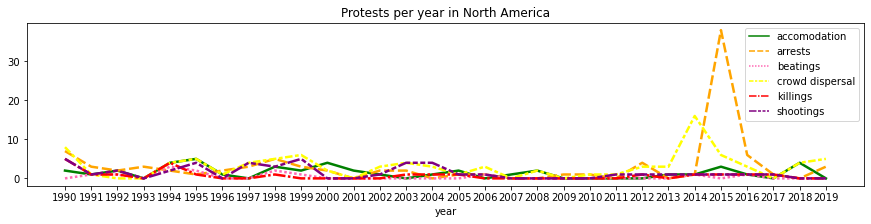

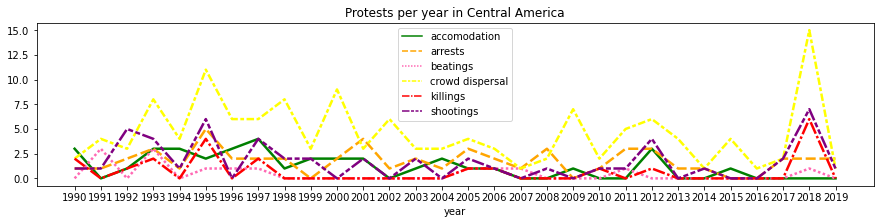

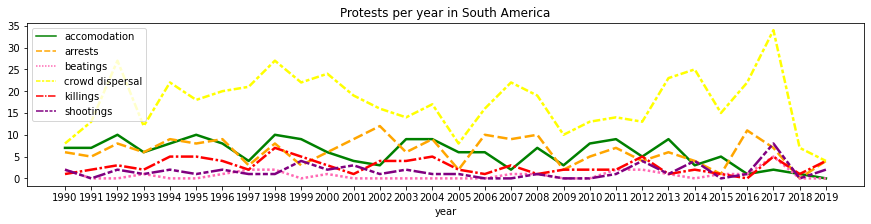

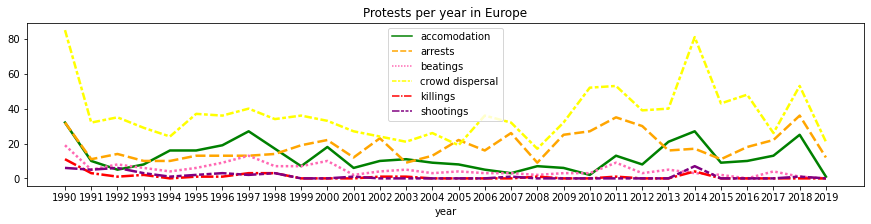

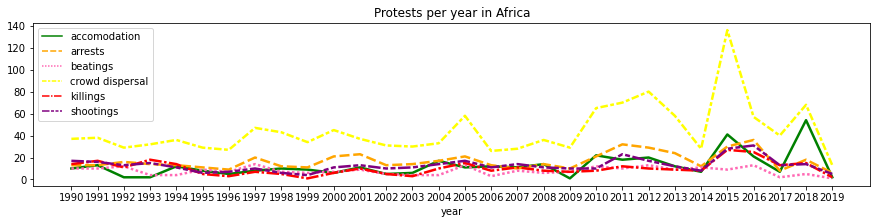

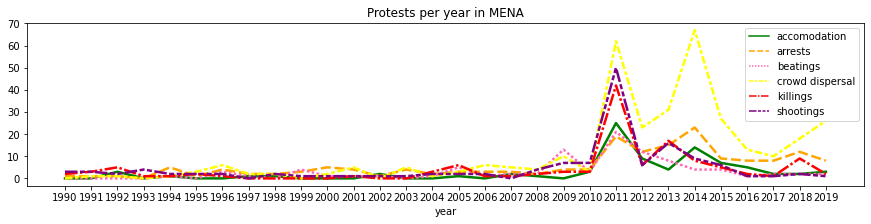

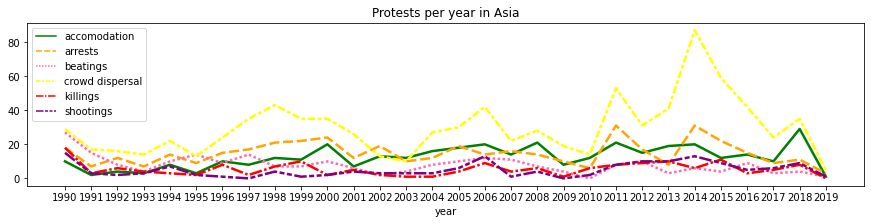

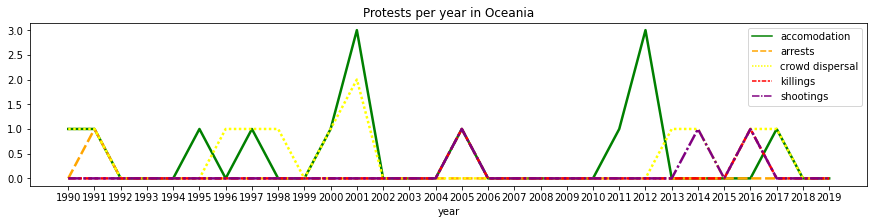

In [177]:
response_palette = {'accomodation':'green',
           'arrests': 'orange',
           'beatings': 'hotpink',
           'crowd dispersal': 'yellow',
           'ignore': 'blue',
           'killings': 'red',
           'shootings': 'purple'}

for region in regions:

    cols_to_drop = list (df_with_categories[df_with_categories['region'] == region].groupby('year').sum()[list_of_responses].sum()[df_with_categories[df_with_categories['region'] == region].groupby('year').sum()[list_of_responses].sum() == 0].index)
    data = df_with_categories[df_with_categories['region'] == region].groupby('year').sum()[list_of_responses].drop(columns = cols_to_drop)

    plt.figure(figsize = (15,3))
    sns.lineplot(data = data, palette = response_palette, linewidth=2.5)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {region}')

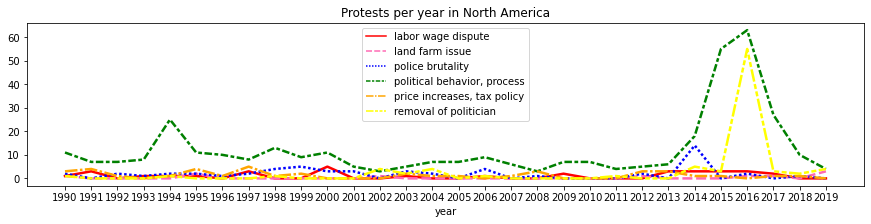

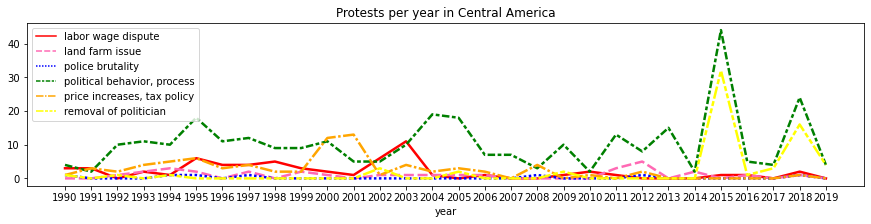

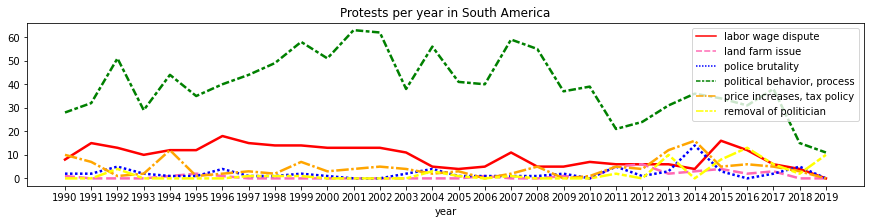

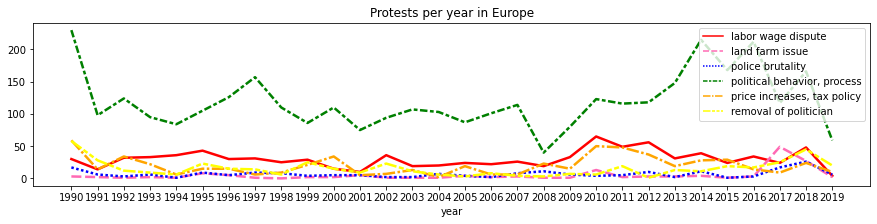

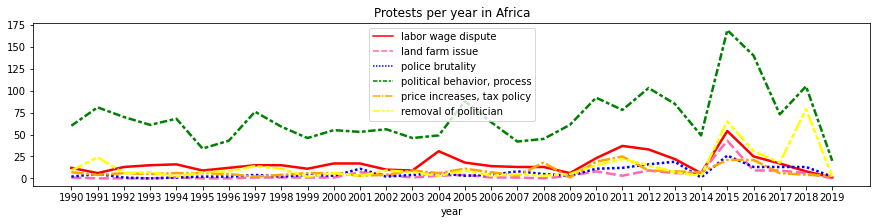

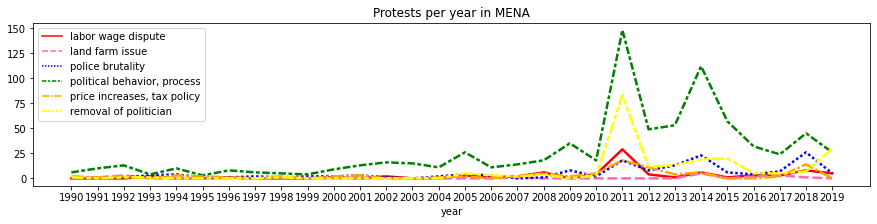

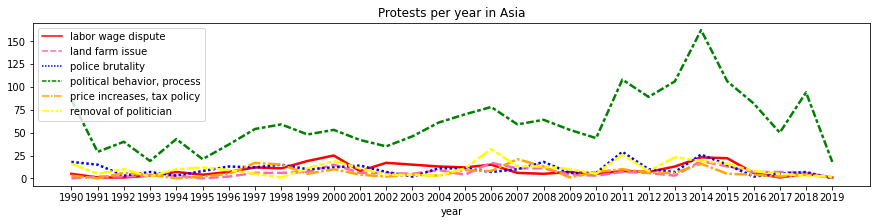

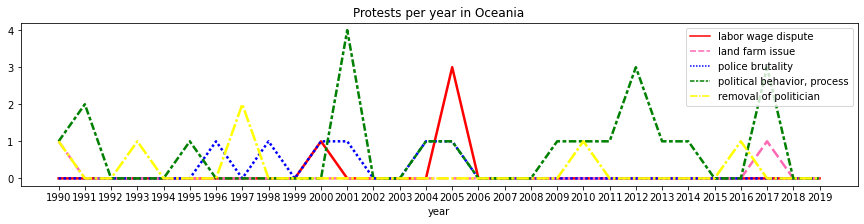

In [178]:
demands_palette = {'labor wage dispute':'red',
           'land farm issue': 'hotpink',
           'police brutality': 'blue',
           'political behavior, process': 'green',
           'price increases, tax policy': 'orange',
           'removal of politician': 'yellow',
           'social restrictions': 'purple'}

for region in regions:

    cols_to_drop = list (df_with_categories[df_with_categories['region'] == region].groupby('year').sum()[list_of_demands].sum()[df_with_categories[df_with_categories['region'] == region].groupby('year').sum()[list_of_demands].sum() == 0].index)
    data = df_with_categories[df_with_categories['region'] == region].groupby('year').sum()[list_of_demands].drop(columns = cols_to_drop)

    plt.figure(figsize = (15,3))
    sns.lineplot(data = data, palette = demands_palette, linewidth=2.5)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {region}')